# Beat Tracking with librosa

See [ELEN E4896 Music Signal Processing](https://www.ee.columbia.edu/~dpwe/e4896/practicals.html#prac09)

2016-03-30 Dan Ellis dpwe@ee.columbia.edu

In [1]:
%pylab inline
from __future__ import print_function
import librosa
import numpy as np
import os
import IPython
import mir_eval   # from "pip install mir_eval"

Populating the interactive namespace from numpy and matplotlib


/Applications/anaconda/lib/python2.7/site-packages/librosa/core/audio.py:37: UserWarning: Could not import scikits.samplerate. Falling back to scipy.signal
  warnings.warn('Could not import scikits.samplerate. '


In [2]:
MIREX_DATA_DIR = '/Users/dpwe/Downloads/prac09/mirex06examples'

In [3]:
# Read in an example soundfile.
example = 'train01'
filename = os.path.join(MIREX_DATA_DIR, example + '.wav')
y, sr = librosa.load(filename, sr=None)
print("Sample rate:", sr, "Data shape:", y.shape)
IPython.display.Audio(data=y, rate=sr)

Sample rate: 44100 Data shape: (1323000,)


(0, 10.0)

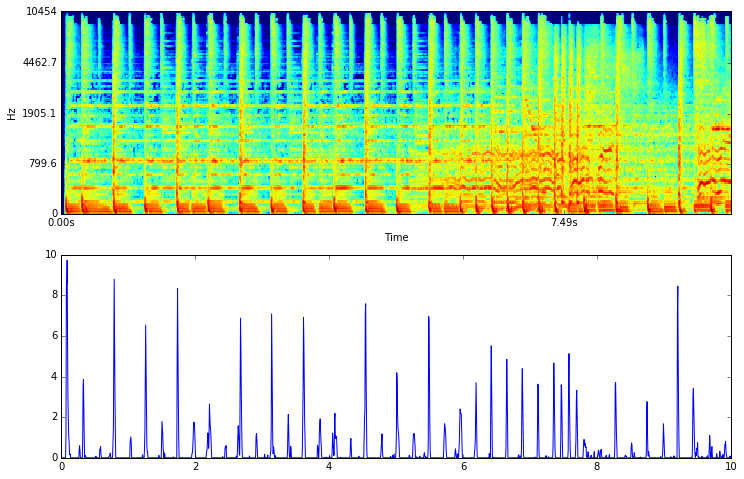

In [4]:
# Calculate the "onset strength envelope", and a mel-spectrogram.
hop_length = 256
frame_rate = sr / hop_length
onset_envelope = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length, aggregate=np.median)
spec = librosa.logamplitude(librosa.feature.melspectrogram(y, sr=sr, n_mels=128, hop_length=hop_length))

# Plot them both.
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
t_max = 10.0
librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='mel', hop_length=hop_length, cmap='jet')
plt.xlim([0, t_max * frame_rate])

onset_timebase = np.arange(onset_envelope.shape[0]) * hop_length / float(sr)
plt.subplot(2,1,2)
plt.plot(onset_timebase, onset_envelope)
plt.xlim([0, t_max])

Estimated tempo: 129.20 beats per minute


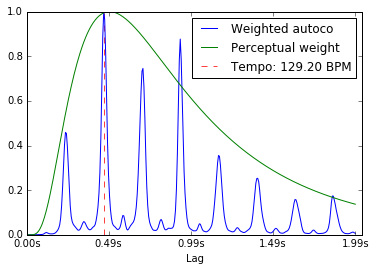

In [5]:
# Estimate the global tempo.
tempo = librosa.beat.estimate_tempo(onset_envelope, sr=sr, hop_length=hop_length)
print('Estimated tempo: {:.2f} beats per minute'.format(tempo))
# Convert tempo estimate from bpm to frames.
tempo_frames = (60 * sr / hop_length) / tempo

# Calculate the envelope autocorrelation that is the basis of the tempo estimate, for display.
ac = librosa.autocorrelate(onset_envelope, 2 * sr // hop_length)
# BPMs corresponding to each lag in autocorrelation.
bpms = 60.0 / ((np.maximum(1.0, np.arange(ac.shape[-1]))) * hop_length / sr)
# "Perceptual weighting" of autocorrelation peaks.
lag_weighting = np.exp(-0.5*(np.log(bpms/120.0)/np.log(2.0))**2)
# Plot the illustration of the tempo estimation.
plt.plot(librosa.util.normalize(lag_weighting * ac), label='Weighted autoco')
plt.plot(lag_weighting, label='Perceptual weight')
plt.vlines([tempo_frames], 0, 1, color='r', alpha=0.75, linestyle='--', label='Tempo: {:.2f} BPM'.format(tempo))
librosa.display.time_ticks(librosa.frames_to_time(np.arange(len(ac)), sr=sr, hop_length=hop_length))
plt.xlabel('Lag')
plt.legend()

In [6]:
# Now run the dynamic-programming beat tracker.
_, beat_frames = librosa.beat.beat_track(onset_envelope=onset_envelope, bpm=tempo, sr=sr, hop_length=hop_length)
# Convert the frame indices of beat events into times in seconds.
beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)
print(beat_times[:5])

[ 0.08126984  0.43537415  0.78947846  1.25968254  1.73569161]


(0, 1720.0)

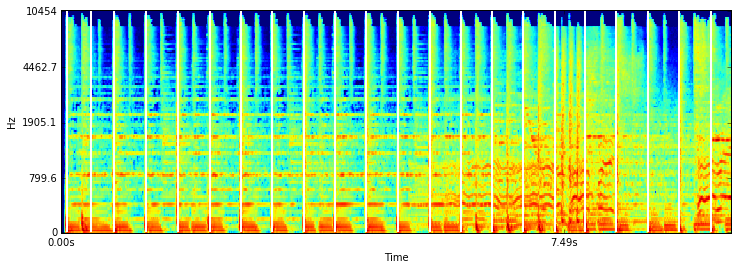

In [7]:
# Plot the beat instants over the mel-spectrogram
plt.figure(figsize=(12, 4))
librosa.display.specshow(spec, x_axis='time', y_axis='mel', cmap='jet', sr=sr, hop_length=hop_length)
plt.vlines(beat_frames, 0, spec.shape[0], colors='w', linestyles='-', linewidth=2, alpha=1.0)
plt.xlim([0, t_max*frame_rate])

In [8]:
# Sonify the detected beats as clicks, and play back mixed with original audio.
clicks = mir_eval.sonify.clicks(beat_times, sr, length=y.shape[0])
IPython.display.Audio(data=y + clicks, rate=sr)

In [9]:
# Read in the ground-truth beat times for all subjects.
ref_file = os.path.join(MIREX_DATA_DIR, example + '.txt')
ref_beat_times = []
with open(ref_file, 'r') as f:
    for line in f:
        ref_beat_times.append(np.array([float(t) for t in line.strip().split('\t')]))
print("Read", len(ref_beat_times), "records with average length", 
      np.mean([len(ref_beats) for ref_beats in ref_beat_times]), "events")


Read 40 records with average length 56.975 events


(0, 1720.0)

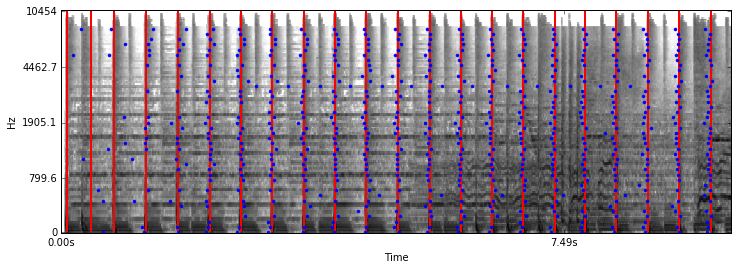

In [10]:
# Plot per-user ground-truth beats over the mel-spectrogram and system beats.
plt.figure(figsize=(12, 4))
librosa.display.specshow(spec, x_axis='time', y_axis='mel', sr=sr, hop_length=hop_length, cmap='gray_r')
plt.vlines(beat_frames, 0, spec.shape[0], colors='r', linestyles='-', linewidth=2, alpha=1.0)
#plt.vlines(np.array(ref_beat_times[0]) * frame_rate, 0, spec.shape[0], colors='r', linestyles='-', linewidth=2, alpha=1.0)
for i in xrange(len(ref_beat_times)):
    plt.plot(ref_beat_times[i] * frame_rate, np.tile(i*3, ref_beat_times[i].shape), '.b')
plt.xlim([0, t_max * frame_rate])

In [11]:
# Sonify an example subject's beat taps.
clicks = mir_eval.sonify.clicks(ref_beat_times[2], sr, length=y.shape[0])
IPython.display.Audio(data=y + clicks, rate=sr)

Mean f_score across all ground truths=0.837


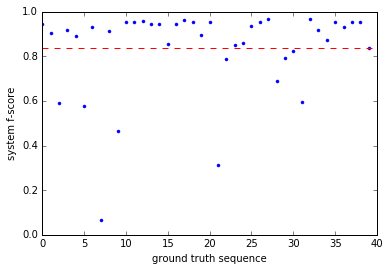

In [12]:
# Calculate the F-measure (harmonic mean of "precision" and "recall" of system beats against each ground-truth.
all_f_scores = []
for i, ref_beat_time in enumerate(ref_beat_times):
    all_f_scores.append(mir_eval.beat.f_measure(np.array(ref_beat_time), beat_times))
mean_f_score = np.mean(all_f_scores)
print("Mean f_score across all ground truths={:.3f}".format(mean_f_score))
plt.plot(all_f_scores, '.')
plt.plot([0, len(all_f_scores)], [mean_f_score, mean_f_score], '--r')
plt.xlabel('ground truth sequence')
plt.ylabel('system f-score')

In [13]:
# Define wrapper functions.
def beat_track(y, sr, hop_length=256):
    """Perform beat tracking on audio waveform."""
    frame_rate = sr / hop_length
    spec = librosa.logamplitude(librosa.feature.melspectrogram(y, sr=sr, n_mels=128, 
                                                               hop_length=hop_length))
    #harmonic, percussive = librosa.decompose.hpss(S=spec, kernel_size=63)
    onset_envelope = librosa.onset.onset_strength(S=spec, sr=sr, hop_length=hop_length, 
                                                  aggregate=np.median)
    tempo = librosa.beat.estimate_tempo(onset_envelope, sr=sr, hop_length=hop_length)
    _, beat_frames = librosa.beat.beat_track(onset_envelope=onset_envelope, bpm=tempo, 
                                             sr=sr, hop_length=hop_length)
    beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)
    return beat_times, onset_envelope, spec

def beat_add_clicks(beat_times, waveform, sr):
    """Synthesize beat clicks at beat_times and add to waveform."""
    clicks = mir_eval.sonify.clicks(beat_times, sr, length=waveform.shape[0])
    return waveform + clicks

def beat_plot(beat_times, spec=None, sr=None, hop_length=None, t_max=None, color='w'):
    """Plot a series of beat time events, optionally over a spectrogram."""
    plt.figure(figsize=(12, 4))
    frame_rate = sr / hop_length
    if spec is not None:
        librosa.display.specshow(spec, x_axis='time', y_axis='mel', cmap='jet', 
                                 sr=sr, hop_length=hop_length)
    beat_frames = beat_times * frame_rate
    plt.vlines(beat_frames, 0, spec.shape[0], colors=color, linestyles='-', 
               linewidth=2, alpha=1.0)
    if t_max:
        plt.xlim([0, t_max * frame_rate])

def beat_ground_truth(filename):
    """Read in the McKinney-Moelents ground truth beat file."""
    # Read in the ground-truth beat times for all subjects.
    ref_beat_times = []
    with open(filename, 'r') as f:
        for line in f:
            ref_beat_times.append([float(t) 
                                   for t in line.strip().split('\t')])
    return ref_beat_times

def beat_score(system_beats, ref_beat_times, header=None):
    """Score system beat times against a set of references."""
    all_f_scores = [mir_eval.beat.f_measure(np.array(ref_beat_time), system_beats) 
                    for ref_beat_time in ref_beat_times]
    mean_f_score = np.mean(all_f_scores)
    if header:
        print('{:s}: mean f_score = {:.3f}'.format(header, mean_f_score))
    return mean_f_score

def beat_test(examples):
    """Beat track multiple soundfiles and score against ground truth."""
    scores = []
    for example in examples:
        wav_filename = os.path.join(MIREX_DATA_DIR, example + '.wav')
        y, sr = librosa.load(wav_filename, sr=None)
        system_beat_times, _, _ = beat_track(y, sr)
        ref_file = os.path.join(MIREX_DATA_DIR, example + '.txt')
        scores.append(beat_score(system_beat_times, beat_ground_truth(ref_file), 
                                 header=example))
    score = np.mean(scores)
    print('Overall average score={:.3f}'.format(score))
    return score

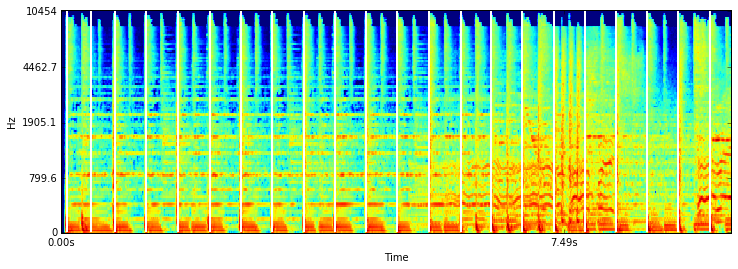

In [14]:
# Redo the original example using the helper functions.
y, sr = librosa.load(filename, sr=None)
hop_length = 256
system_beat_times, onset_envelope, spectrogram = beat_track(y, sr, hop_length=hop_length)
beat_plot(system_beat_times, spec=spectrogram, sr=sr, hop_length=hop_length, t_max=10.0)
IPython.display.Audio(data=beat_add_clicks(system_beat_times, y, sr), rate=sr)

In [15]:
# Run a test over the entire ground truth set.
example_names = ['train{:02d}'.format(i) for i in xrange(1,21)]
beat_test(example_names)

train01: mean f_score = 0.834
train02: mean f_score = 0.276
train03: mean f_score = 0.324
train04: mean f_score = 0.373
train05: mean f_score = 0.720
train06: mean f_score = 0.424
train07: mean f_score = 0.405
train08: mean f_score = 0.756
train09: mean f_score = 0.695
train10: mean f_score = 0.445
train11: mean f_score = 0.676
train12: mean f_score = 0.202
train13: mean f_score = 0.324
train14: mean f_score = 0.602
train15: mean f_score = 0.497
train16: mean f_score = 0.459
train17: mean f_score = 0.189
train18: mean f_score = 0.226
train19: mean f_score = 0.473
train20: mean f_score = 0.455
Overall average score=0.468


0.46768279577188326